# Individual Coding Assignment
## Description
This assignment will review and try to improve upon the last assignment. I will also try to improve upon the spatial visualization by incorporating things learned in week 4.

In [241]:
# importing pandas library
import pandas as pd

In [242]:
# load a data file
df = pd.read_csv('data/Poor_Health.csv')

In [243]:
# size of data (# of rows, # of columns)
df.shape

(210, 11)

In [244]:
# a look at the top 5 rows
df.head()

,OBJECTID,Geo_ID,Geo_Type,Geo_Name,Poor_health,Poor_health_LCL,Poor_health_UCL,Poor_health_RSE,Poor_health_EST,SHAPE_Length,SHAPE_Area
0,1,csa_city_agoura_hills,Incorporated City,City of Agoura Hills,NaN,NaN,NaN,NaN,NaN,80376.210690,2.179317e+08
1,2,csa_city_alhambra,Incorporated City,City of Alhambra,14.9,12.3,17.5,8.821902,small area estimate,69016.501522,2.127640e+08
2,3,csa_city_arcadia,Incorporated City,City of Arcadia,11.2,9.3,13.2,8.938394,small area estimate,132149.401563,3.096963e+08
3,4,csa_city_artesia,Incorporated City,City of Artesia,NaN,NaN,NaN,NaN,NaN,40904.970655,4.521033e+07
4,5,csa_city_azusa,Incorporated City,City of Azusa,14.3,12.1,16.5,7.785253,small area estimate,158881.601593,2.692050e+08


In [245]:
# look at the data types, verbose = True shows us all the counts
df.info(verbose=True, show_counts=True)
# compare non-null to shape of data to ensure no null

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210 entries, 0 to 209
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   OBJECTID         210 non-null    int64  
 1   Geo_ID           210 non-null    object 
 2   Geo_Type         210 non-null    object 
 3   Geo_Name         210 non-null    object 
 4   Poor_health      78 non-null     float64
 5   Poor_health_LCL  78 non-null     float64
 6   Poor_health_UCL  78 non-null     float64
 7   Poor_health_RSE  78 non-null     float64
 8   Poor_health_EST  78 non-null     object 
 9   SHAPE_Length     210 non-null    float64
 10  SHAPE_Area       210 non-null    float64
dtypes: float64(6), int64(1), object(4)
memory usage: 18.2+ KB


In [246]:
# axis = 0 drops rows with null
df = df.dropna(axis=0,how="any")

In [247]:
# confirm rows with null have been dropped
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 78 entries, 1 to 209
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   OBJECTID         78 non-null     int64  
 1   Geo_ID           78 non-null     object 
 2   Geo_Type         78 non-null     object 
 3   Geo_Name         78 non-null     object 
 4   Poor_health      78 non-null     float64
 5   Poor_health_LCL  78 non-null     float64
 6   Poor_health_UCL  78 non-null     float64
 7   Poor_health_RSE  78 non-null     float64
 8   Poor_health_EST  78 non-null     object 
 9   SHAPE_Length     78 non-null     float64
 10  SHAPE_Area       78 non-null     float64
dtypes: float64(6), int64(1), object(4)
memory usage: 7.3+ KB


In [248]:
# reinspect data
df.head()

,OBJECTID,Geo_ID,Geo_Type,Geo_Name,Poor_health,Poor_health_LCL,Poor_health_UCL,Poor_health_RSE,Poor_health_EST,SHAPE_Length,SHAPE_Area
1,2,csa_city_alhambra,Incorporated City,City of Alhambra,14.9,12.3,17.5,8.821902,small area estimate,69016.501522,2.127640e+08
2,3,csa_city_arcadia,Incorporated City,City of Arcadia,11.2,9.3,13.2,8.938394,small area estimate,132149.401563,3.096963e+08
4,5,csa_city_azusa,Incorporated City,City of Azusa,14.3,12.1,16.5,7.785253,small area estimate,158881.601593,2.692050e+08
5,6,csa_city_baldwin_park,Incorporated City,City of Baldwin Park,15.5,13.1,17.9,8.031448,small area estimate,87241.432741,1.889662e+08
6,7,csa_city_bell,Incorporated City,City of Bell,17.2,14.0,20.5,9.507151,small area estimate,65552.388758,7.297903e+07


In [249]:
# define columns to keep; you will have to look at your source's metadata to determine which columns to keep and what they mean
columns_to_keep = ['Geo_ID',
                   'Geo_Name',
                   'Poor_health']
# add it to a new dataframe
df2 = df[columns_to_keep]

In [250]:
# see new dataframe
df2.head()

,Geo_ID,Geo_Name,Poor_health
1,csa_city_alhambra,City of Alhambra,14.9
2,csa_city_arcadia,City of Arcadia,11.2
4,csa_city_azusa,City of Azusa,14.3
5,csa_city_baldwin_park,City of Baldwin Park,15.5
6,csa_city_bell,City of Bell,17.2


In [251]:
# access a single column
df2['Poor_health'].head()

1    14.9
2    11.2
4    14.3
5    15.5
6    17.2
Name: Poor_health, dtype: float64

In [252]:
# get some stats
df2['Poor_health'].describe()

count    78.000000
mean     12.192308
std       3.703237
min       3.800000
25%      10.125000
50%      12.100000
75%      14.375000
max      20.100000
Name: Poor_health, dtype: float64

In [253]:
# What is the median?
df2['Poor_health'].median()

12.1

<Axes: ylabel='Frequency'>

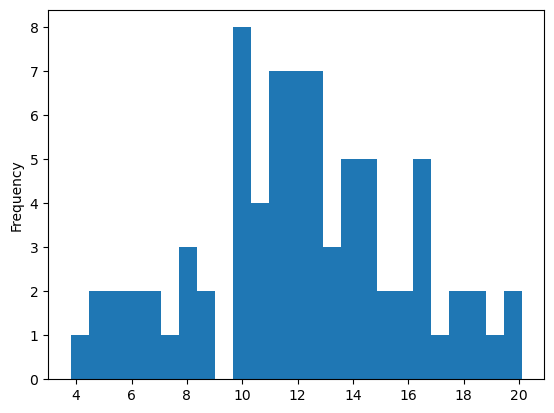

In [254]:
# plot it as a historgram with 25 bins
df2['Poor_health'].plot.hist(bins=25)

In [255]:
# sort by poor health % from highest to lowest
df_sorted = df2.sort_values(by='Poor_health',ascending = False)

In [256]:
# display the top 10 rows of the data
df_sorted.head(10)

,Geo_ID,Geo_Name,Poor_health
31,csa_city_huntington_park,City of Huntington Park,20.1
22,csa_city_el_monte,City of El Monte,19.9
18,csa_city_cudahy,City of Cudahy,18.8
122,csa_unincorp_florence_firestone,Unincorporated - Florence-Firestone,18.5
47,csa_city_maywood,City of Maywood,18.4
7,csa_city_bell_gardens,City of Bell Gardens,17.8
56,csa_city_rosemead,City of Rosemead,17.6
6,csa_city_bell,City of Bell,17.2
49,csa_city_monterey_park,City of Monterey Park,16.8
93,csa_unincorp_athens_westmont,Unincorporated - Athens-Westmont,16.7


<Axes: xlabel='Geo_Name'>

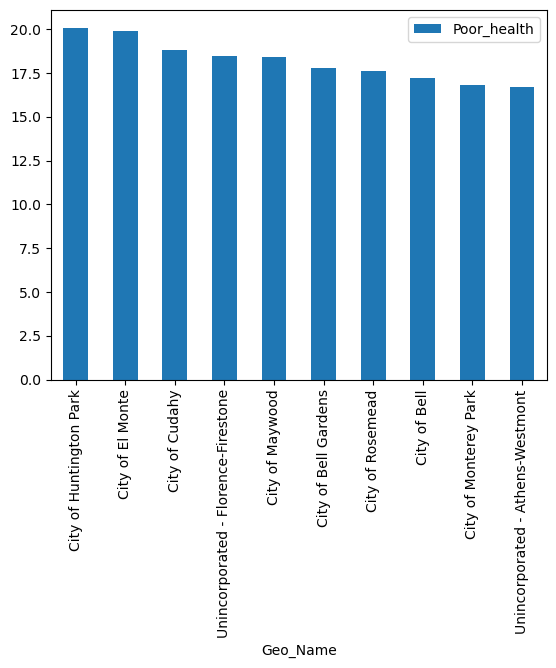

In [257]:
# plot it
df_sorted.head(10).plot.bar(x='Geo_Name',
                            y='Poor_health')

<Axes: title={'center': 'Top 10 Neighborhoods with Highest % of Residents Reporting Poor Health in 2020 L.A. County'}, ylabel='Geo_Name'>

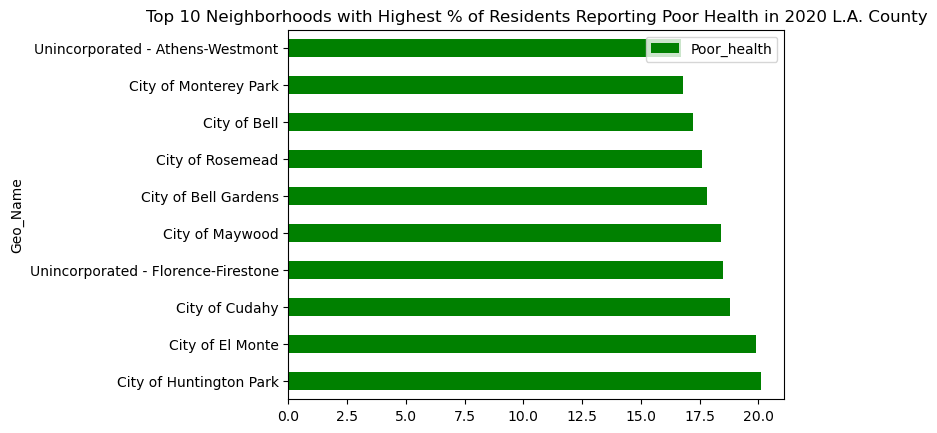

In [258]:
# Make it prettier with a title
df_sorted.head(10).plot.barh(x='Geo_Name',
                            y='Poor_health', 
                            title='Top 10 Neighborhoods with Highest % of Residents Reporting Poor Health in 2020 L.A. County',
                            color='green')

In [259]:
# import geopandas library
import geopandas as gpd

In [260]:
# read in a geojson file downloaded from the LA Times
tracts=gpd.read_file('data/Poor_Health.geojson')
tracts.head()

,OBJECTID,Geo_ID,Geo_Type,Geo_Name,Poor_health,Poor_health_LCL,Poor_health_UCL,Poor_health_RSE,Poor_health_EST,SHAPE_Length,SHAPE_Area,geometry
0,1,csa_city_agoura_hills,Incorporated City,City of Agoura Hills,NaN,NaN,NaN,NaN,,0.248873,0.001979,"MULTIPOLYGON (((-118.72865 34.16793, -118.7286..."
1,2,csa_city_alhambra,Incorporated City,City of Alhambra,14.9,12.3,17.5,8.821902,small area estimate,0.208116,0.001931,"MULTIPOLYGON (((-118.12110 34.10537, -118.1180..."
2,3,csa_city_arcadia,Incorporated City,City of Arcadia,11.2,9.3,13.2,8.938394,small area estimate,0.395906,0.002812,"MULTIPOLYGON (((-118.00673 34.12935, -118.0074..."
3,4,csa_city_artesia,Incorporated City,City of Artesia,NaN,NaN,NaN,NaN,,0.122432,0.000409,"MULTIPOLYGON (((-118.08782 33.88035, -118.0869..."
4,5,csa_city_azusa,Incorporated City,City of Azusa,14.3,12.1,16.5,7.785253,small area estimate,0.479638,0.002445,"MULTIPOLYGON (((-117.89006 34.16512, -117.8900..."


In [261]:
# axis = 0 drops rows with null
tracts = tracts.dropna(axis=0,how="any")

In [262]:
# confirm rows with null have been dropped
tracts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 78 entries, 1 to 209
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   OBJECTID         78 non-null     int64   
 1   Geo_ID           78 non-null     object  
 2   Geo_Type         78 non-null     object  
 3   Geo_Name         78 non-null     object  
 4   Poor_health      78 non-null     float64 
 5   Poor_health_LCL  78 non-null     float64 
 6   Poor_health_UCL  78 non-null     float64 
 7   Poor_health_RSE  78 non-null     float64 
 8   Poor_health_EST  78 non-null     object  
 9   SHAPE_Length     78 non-null     float64 
 10  SHAPE_Area       78 non-null     float64 
 11  geometry         78 non-null     geometry
dtypes: float64(6), geometry(1), int64(1), object(4)
memory usage: 7.9+ KB


<Axes: >

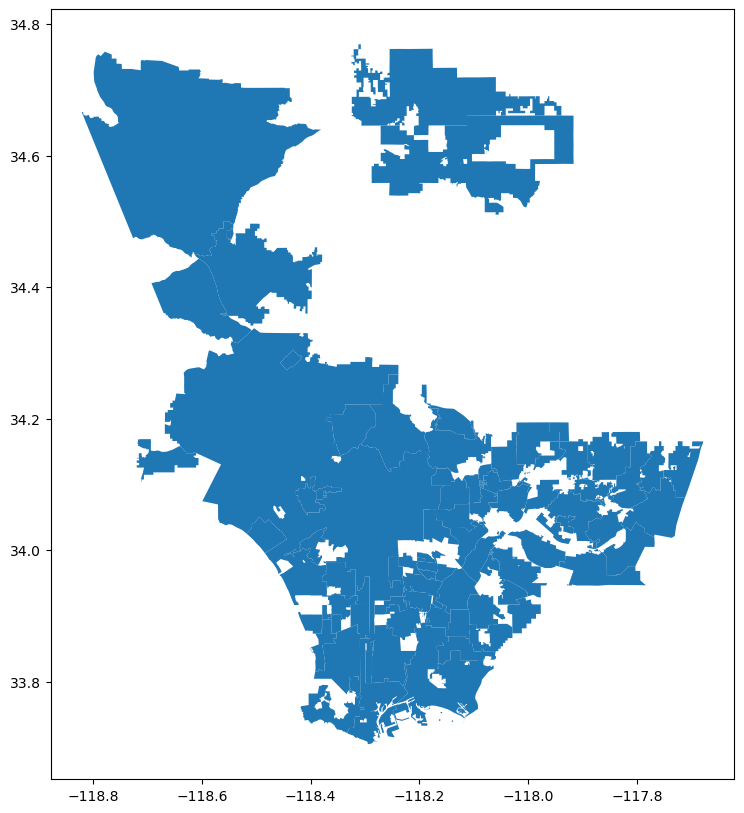

In [263]:
# plot it
tracts.plot(figsize=(12,10))

In [264]:
# we only really need Geo_ID and geometry, so let's subset the data
tracts = tracts[['Geo_ID','geometry']]
tracts.head()

,Geo_ID,geometry
1,csa_city_alhambra,"MULTIPOLYGON (((-118.12110 34.10537, -118.1180..."
2,csa_city_arcadia,"MULTIPOLYGON (((-118.00673 34.12935, -118.0074..."
4,csa_city_azusa,"MULTIPOLYGON (((-117.89006 34.16512, -117.8900..."
5,csa_city_baldwin_park,"MULTIPOLYGON (((-117.94877 34.09239, -117.9488..."
6,csa_city_bell,"MULTIPOLYGON (((-118.16706 33.97936, -118.1671..."


In [265]:
# create a new dataframe based on the join
tracts_health=tracts.merge(df2,on="Geo_ID")

In [266]:
# what does it look like now?
tracts_health.head()

,Geo_ID,geometry,Geo_Name,Poor_health
0,csa_city_alhambra,"MULTIPOLYGON (((-118.12110 34.10537, -118.1180...",City of Alhambra,14.9
1,csa_city_arcadia,"MULTIPOLYGON (((-118.00673 34.12935, -118.0074...",City of Arcadia,11.2
2,csa_city_azusa,"MULTIPOLYGON (((-117.89006 34.16512, -117.8900...",City of Azusa,14.3
3,csa_city_baldwin_park,"MULTIPOLYGON (((-117.94877 34.09239, -117.9488...",City of Baldwin Park,15.5
4,csa_city_bell,"MULTIPOLYGON (((-118.16706 33.97936, -118.1671...",City of Bell,17.2


<Axes: >

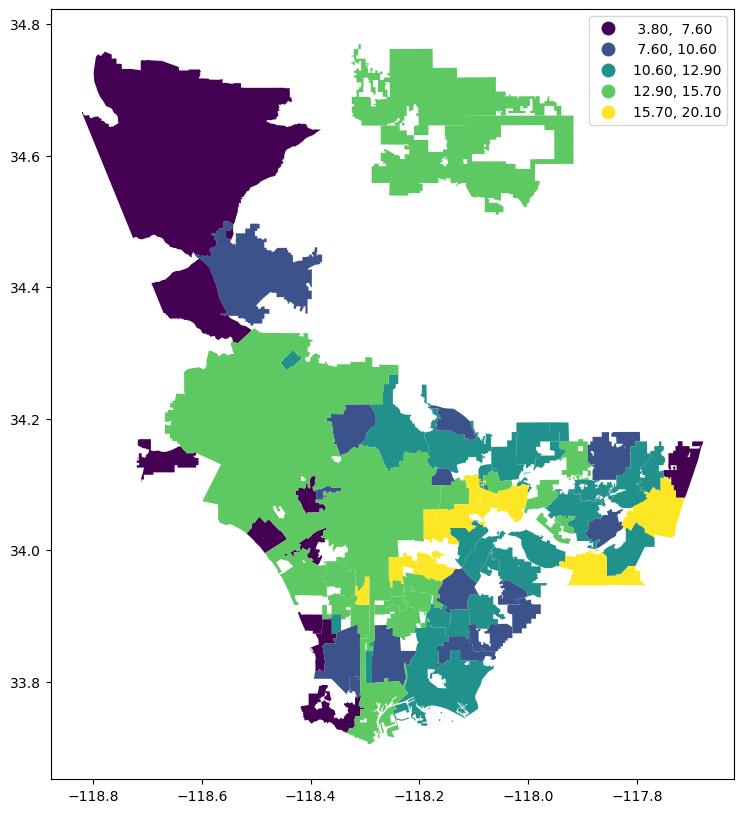

In [267]:
# plot tracts color coded by percentage ranges (according to natural breaks) of residents reporting poor health 
tracts_health.plot(figsize=(12,10),
                 column='Poor_health',
                 legend=True, 
                 scheme='NaturalBreaks')

<Axes: >

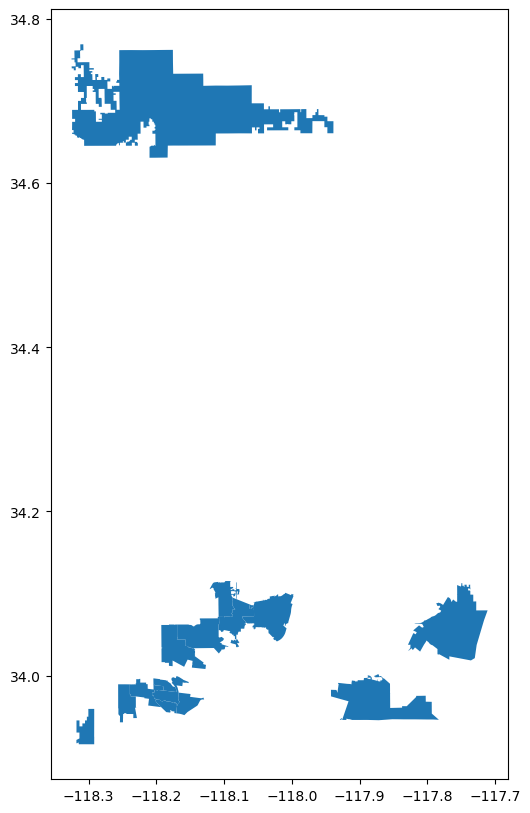

In [268]:
# neighborhoods with the highest natural break % range of residents reporting poor health
tracts_health[tracts_health.Poor_health >= 15.70].plot(figsize=(12,10))

<Axes: >

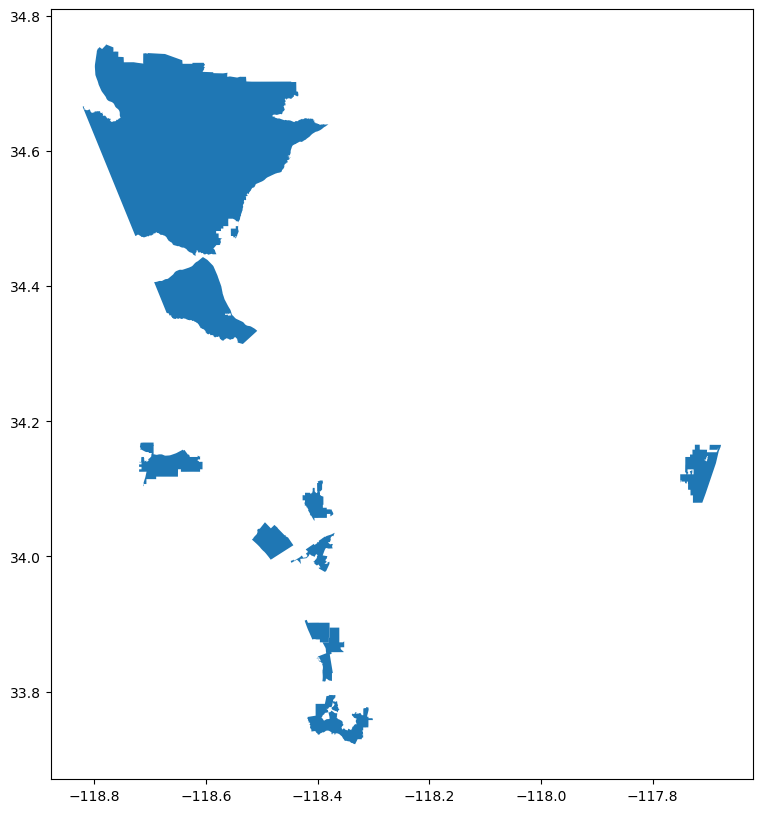

In [269]:
# neighborhoods with the lowest natural break % range of residents reporting poor health
tracts_health[tracts_health.Poor_health <= 7.60].plot(figsize=(12,10))

In [270]:
import folium

In [271]:
# folium map of above neighborhood health data
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=tracts_health, # geo data
                  data=tracts_health, # data          
                  key_on='feature.properties.Geo_ID', # key, or merge column
                  columns=['Geo_ID', 'Poor_health'], # [key, value]
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='% Reporting Poor Health (2020)').add_to(m)    # name on the legend color bar
m

The above map shows the neighborhoods in L.A. County, color-coded by low (very light purple) to high (purple) percentage of residents reporting poor health.

In [272]:
# save as html
m.save('LA_Poor_Health.html')

In [273]:
# folium map of same neighborhood health data using better/more intuitive color scheme
m2 = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=tracts_health, # geo data
                  data=tracts_health, # data          
                  key_on='feature.properties.Geo_ID', # key, or merge column
                  columns=['Geo_ID', 'Poor_health'], # [key, value]
                  fill_color='YlOrRd',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='% Reporting Poor Health (2020)').add_to(m2)    # name on the legend color bar
m2

The above map shows the neighborhoods in L.A. County, color-coded in a better, gradient and more visible colorway by low (yellow) to high (red) percentage of residents reporting poor health.

In [274]:
m.save('LA_Poor_Health_2.html')

In [275]:
# to give more power to your figures (plots)
import matplotlib.pyplot as plt
import contextily as ctx

In [276]:
# for interactive plots
import plotly.express as px

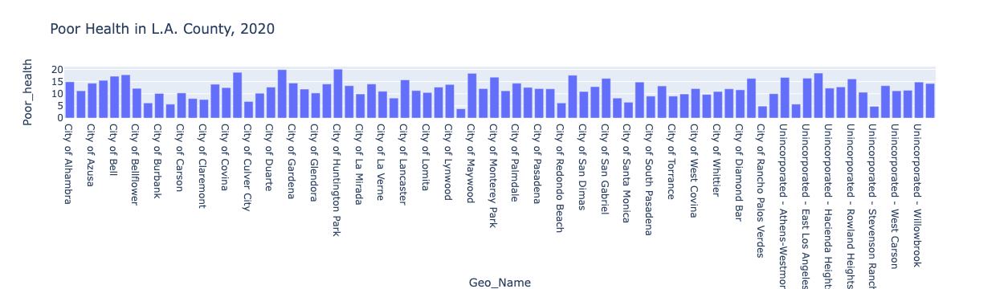

In [277]:
# a simple bar chart, putting neighborhood on the x-axis
fig = px.bar(tracts_health,
       x='Geo_Name',
             y='Poor_health',
       title='Poor Health in L.A. County, 2020'
      )

# show the figure
fig.show()

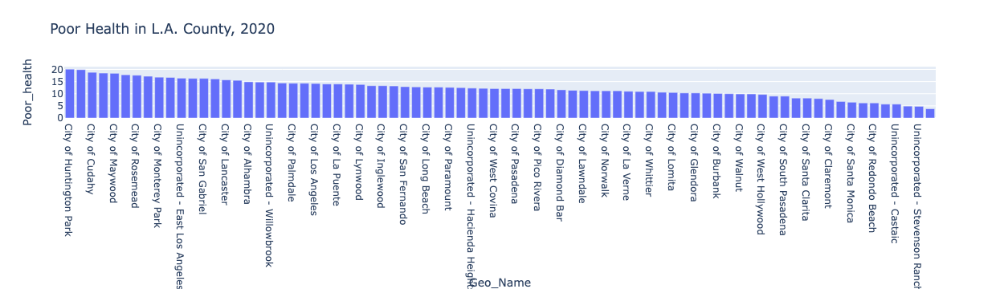

In [278]:
# a simple bar chart of the sorted dataframe, putting neighborhood on the x-axis
fig = px.bar(df_sorted,
       x='Geo_Name',
             y='Poor_health',
       title='Poor Health in L.A. County, 2020'
      )

# show the figure
fig.show()

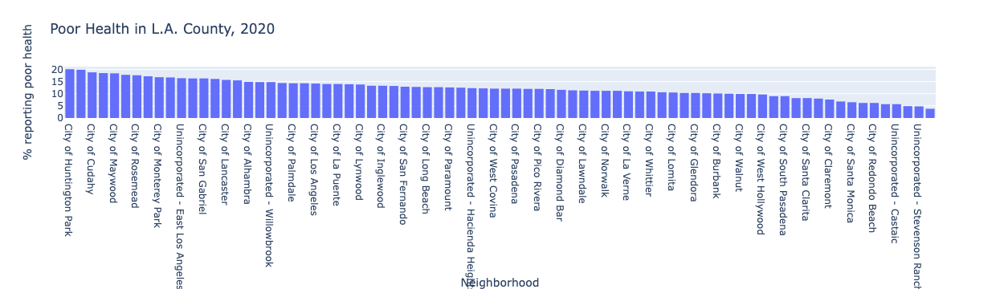

In [279]:
# add labels by providing a dict
fig = px.bar(
        df_sorted,
        x='Geo_Name',
             y='Poor_health',
        title='Poor Health in L.A. County, 2020',
        labels={
            'Geo_Name':'Neighborhood',
            'Poor_health':'% reporting poor health'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

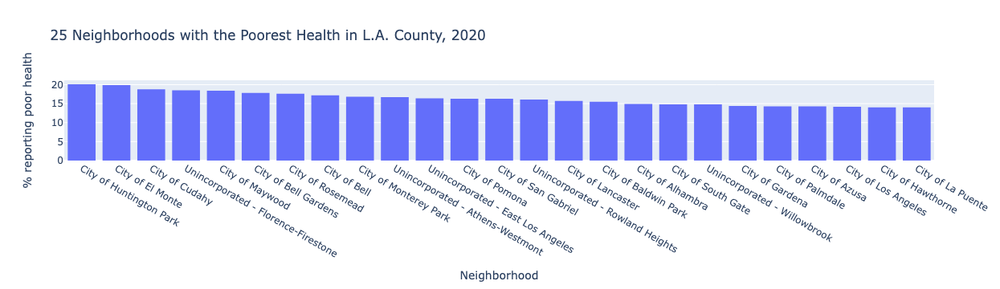

In [280]:
# plot the top 25 neighborhoods with the highest % reporting poor health
fig = px.bar(
        df_sorted.head(25),
        x='Geo_Name',
             y='Poor_health',
        title='25 Neighborhoods with the Poorest Health in L.A. County, 2020',
        labels={
            'Geo_Name':'Neighborhood',
            'Poor_health':'% reporting poor health'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

The above bar chart shows the 25 neighborhoods in L.A. County with the highest percentage of its residents reporting poor health, including L.A. City.

<Axes: >

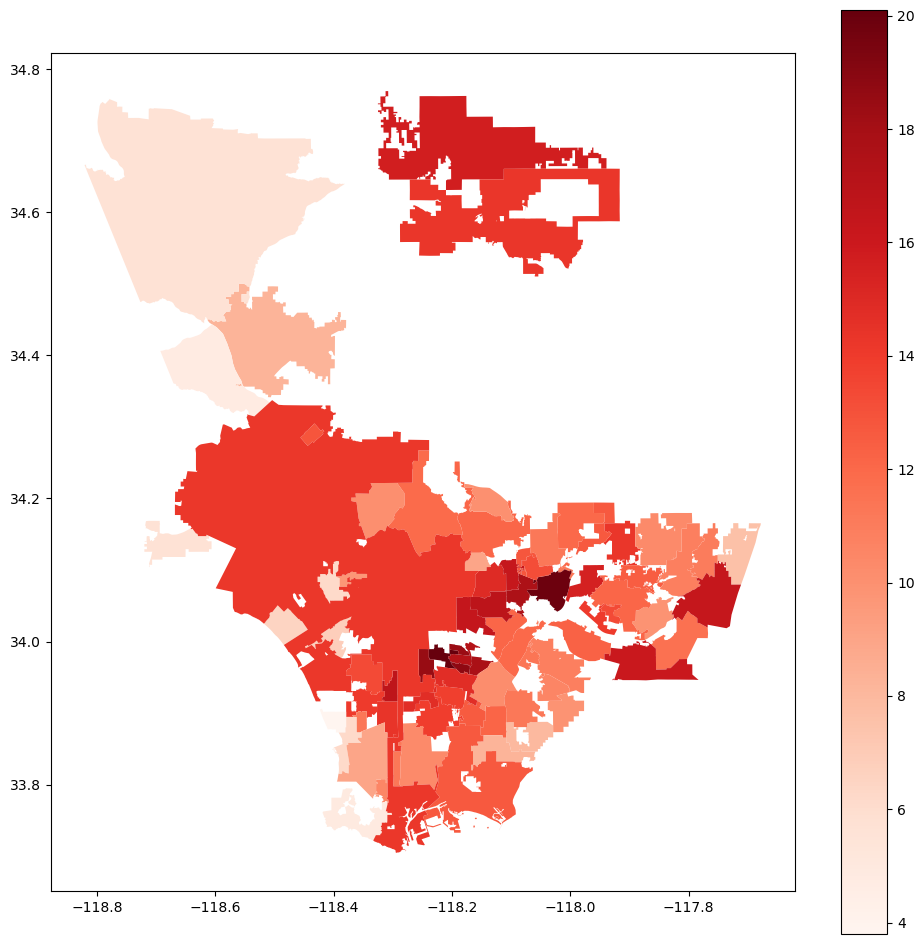

In [281]:
# choropleth map of % poor health by neighborhoods
fig,ax = plt.subplots(figsize=(12,12))

tracts_health.plot(ax=ax,column='Poor_health',legend=True,cmap='Reds')

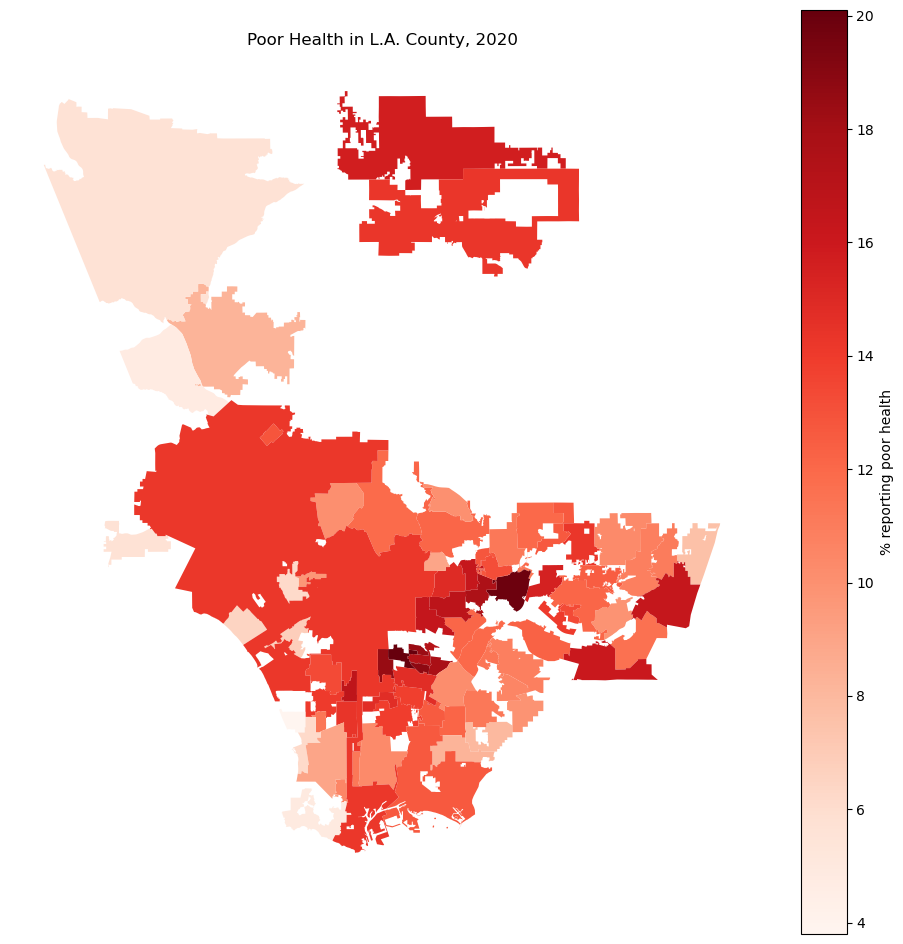

In [283]:
import matplotlib.pyplot as plt
# Create the plot
fig, ax = plt.subplots(figsize=(12, 12))
tracts_health.plot(column='Poor_health', legend=True, cmap='Reds', ax=ax,
                   # add legend keywords and orientation
                           legend_kwds={"label": "% reporting poor health", "orientation": "vertical"},)
# turn x y axis off
ax.axis('off')
# add title
ax.set_title('Poor Health in L.A. County, 2020')
# save figure as jpg
plt.savefig('data/poor_health.jpg')

The above is a "heat map" type of visualization that highlights the neighborhoods with a high percentage of its residents reporting poor health with bold, darker shades of red.